In [1]:
import sys
import tensorflow as tf
sys.path.append("/visuworks/Blindless_AIFFELTON/Models")

# import customized modules
import preprocess, data_generator, check_result, metrics, loss, train

sys.path.append("/visuworks/Blindless_AIFFELTON/Models/FR_Unet")
import fr_unet

# Insert Path
# {model_name}_{epoch}ep_{model_inpusize}_{Generator | aG/fG/sG}
FILE_NAME = 'fr_unet_20ep_512_1024_sG'
INPUT_SHAPE = (440, 440, 1)
RESIZE_SHAPE = (880, 880, 1)
MODEL_PATH = "/visuworks/Blindless_AIFFELTON/Models/FR_Unet/model_parameters/" + FILE_NAME + ".tf"
HISTORY_PATH = "/visuworks/Blindless_AIFFELTON/Models/FR_Unet/history/" + FILE_NAME + '_history' ".json"
SOURCE = '/visuworks/Dataset/Selected Dataset 2'

2024-01-29 14:41:02.990871: I tensorflow/core/util/port.cc:113] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2024-01-29 14:41:03.044019: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-01-29 14:41:03.044048: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-01-29 14:41:03.045416: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2024-01-29 14:41:03.053520: I tensorflow/core/platform/cpu_feature_guar

In [2]:
# Define custom objects for loading the model
custom_objects = {'DiceLoss': loss.DiceLoss(), 
                  'sensitivity': metrics.sensitivity,
                  'specificity': metrics.specificity,
                  'accuracy' : metrics.accuracy}

# Create augmentation
train_preproc = preprocess.build_augmentation_for_general(RESIZE_SHAPE[0], RESIZE_SHAPE[0])
test_preproc = preprocess.build_augmentation_for_general(RESIZE_SHAPE[0], RESIZE_SHAPE[0], is_train=False)

# Create train, test generator
train_generator = data_generator.SlicedDataGenerator(
    SOURCE, 
    number_of_images = 1,
    img_size=INPUT_SHAPE,
    output_size=INPUT_SHAPE,
    resize_shape = RESIZE_SHAPE,
    is_train=True,
    augmentation= train_preproc
)

test_generator = data_generator.SlicedDataGenerator(
    SOURCE,
    number_of_images = 1,
    img_size=INPUT_SHAPE,
    output_size=INPUT_SHAPE,
    resize_shape = RESIZE_SHAPE,
    is_train=False,
    augmentation= test_preproc
)

# Create model
model = fr_unet.FR_UNet(num_classes=1, feature_scale=2, dropout=0.2, fuse=True, out_ave=True)

# # Input shape
input_shape = (440, 440, 1)

# # Build the model with the specified input shape
model.build(input_shape=(None, *input_shape))

# # Display the model summary
model.summary()

2024-01-29 14:41:07.756411: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1929] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 20763 MB memory:  -> device: 0, name: NVIDIA L4, pci bus id: 0000:00:03.0, compute capability: 8.9


Model: "fr_u_net"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 block (Block)               multiple                  23648     
                                                                 
 block_1 (Block)             multiple                  42496     
                                                                 
 block_2 (Block)             multiple                  81408     
                                                                 
 block_3 (Block)             multiple                  81408     
                                                                 
 block_4 (Block)             multiple                  81408     
                                                                 
 block_5 (Block)             multiple                  37120     
                                                                 
 block_6 (Block)             multiple                  371

In [3]:
train.model_train(model,
                  epoch = 30,
                  train_generator = train_generator,
                  test_generator = test_generator,
                  model_path = MODEL_PATH,
                  history_path = HISTORY_PATH,
                  save_every_epoch=True,
                  apply_weight_decay=True)


Epoch 00001: WeightDecayScheduler setting learning rate to 9.999899747381279e-05.
Epoch 1/30


2024-01-29 05:45:05.587116: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:961] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape infr_u_net/block/conv_block/sequential/dropout/dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer
2024-01-29 05:45:08.225181: I external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:454] Loaded cuDNN version 8904
2024-01-29 05:45:16.254401: I external/local_xla/xla/service/service.cc:168] XLA service 0x7f6d62e5bae0 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
2024-01-29 05:45:16.254433: I external/local_xla/xla/service/service.cc:176]   StreamExecutor device (0): NVIDIA L4, Compute Capability 8.9
2024-01-29 05:45:16.260549: I tensorflow/compiler/mlir/tensorflow/utils/dump_mlir_util.cc:269] disabling MLIR crash reproducer, set env var `MLIR_CRASH_REPRODUCER_DIRECTORY` to enable.
I0000 00:00:1706507116.370139    6077 device_compiler.h:186] Compiled clus

1177/1177 [==============================] - ETA: 0s - loss: 0.3550 - sensitivity: 0.6888 - specificity: 0.9662 - accuracy: 0.9473WARNING:tensorflow:Skipping full serialization of Keras layer <fr_unet.FeatureFuse object at 0x7f74484f81c0>, because it is not built.


INFO:tensorflow:Assets written to: /visuworks/Blindless_AIFFELTON/Models/FR_Unet/model_parameters/fr_unet_30ep_512_1024_sG.tf/1--0.3550-0.6888-0.9662-0.7618-0.9676.pb/assets


INFO:tensorflow:Assets written to: /visuworks/Blindless_AIFFELTON/Models/FR_Unet/model_parameters/fr_unet_30ep_512_1024_sG.tf/1--0.3550-0.6888-0.9662-0.7618-0.9676.pb/assets


Model saved to /visuworks/Blindless_AIFFELTON/Models/FR_Unet/model_parameters/fr_unet_30ep_512_1024_sG.tf/1--0.3550-0.6888-0.9662-0.7618-0.9676.pb
1177/1177 [==============================] - 1627s 1s/step - loss: 0.3550 - sensitivity: 0.6888 - specificity: 0.9662 - accuracy: 0.9473 - val_loss: 0.2735 - val_sensitivity: 0.7618 - val_specificity: 0.9676 - val_accuracy: 0.9547

Epoch 00002: WeightDecayScheduler setting learning rate to 9.99980006775877e-05.
Epoch 2/30
1177/1177 [==============================] - ETA: 0s - loss: 0.2576 - sensitivity: 0.7404 - specificity: 0.9790 - accuracy: 0.9629WARNING:tensorflow:Skipping full serialization of Keras layer <fr_unet.FeatureFuse object at 0x7f74484f81c0>, because it is not built.


INFO:tensorflow:Assets written to: /visuworks/Blindless_AIFFELTON/Models/FR_Unet/model_parameters/fr_unet_30ep_512_1024_sG.tf/2--0.2576-0.7404-0.9790-0.8183-0.9650.pb/assets


INFO:tensorflow:Assets written to: /visuworks/Blindless_AIFFELTON/Models/FR_Unet/model_parameters/fr_unet_30ep_512_1024_sG.tf/2--0.2576-0.7404-0.9790-0.8183-0.9650.pb/assets


Model saved to /visuworks/Blindless_AIFFELTON/Models/FR_Unet/model_parameters/fr_unet_30ep_512_1024_sG.tf/2--0.2576-0.7404-0.9790-0.8183-0.9650.pb
1177/1177 [==============================] - 1557s 1s/step - loss: 0.2576 - sensitivity: 0.7404 - specificity: 0.9790 - accuracy: 0.9629 - val_loss: 0.2574 - val_sensitivity: 0.8183 - val_specificity: 0.9650 - val_accuracy: 0.9562

Epoch 00003: WeightDecayScheduler setting learning rate to 9.999700388136262e-05.
Epoch 3/30
1177/1177 [==============================] - ETA: 0s - loss: 0.2399 - sensitivity: 0.7527 - specificity: 0.9803 - accuracy: 0.9651WARNING:tensorflow:Skipping full serialization of Keras layer <fr_unet.FeatureFuse object at 0x7f74484f81c0>, because it is not built.


INFO:tensorflow:Assets written to: /visuworks/Blindless_AIFFELTON/Models/FR_Unet/model_parameters/fr_unet_30ep_512_1024_sG.tf/3--0.2399-0.7527-0.9803-0.7586-0.9789.pb/assets


INFO:tensorflow:Assets written to: /visuworks/Blindless_AIFFELTON/Models/FR_Unet/model_parameters/fr_unet_30ep_512_1024_sG.tf/3--0.2399-0.7527-0.9803-0.7586-0.9789.pb/assets


Model saved to /visuworks/Blindless_AIFFELTON/Models/FR_Unet/model_parameters/fr_unet_30ep_512_1024_sG.tf/3--0.2399-0.7527-0.9803-0.7586-0.9789.pb
1177/1177 [==============================] - 1556s 1s/step - loss: 0.2399 - sensitivity: 0.7527 - specificity: 0.9803 - accuracy: 0.9651 - val_loss: 0.2306 - val_sensitivity: 0.7586 - val_specificity: 0.9789 - val_accuracy: 0.9651

Epoch 00004: WeightDecayScheduler setting learning rate to 9.999600708513754e-05.
Epoch 4/30
1177/1177 [==============================] - ETA: 0s - loss: 0.2295 - sensitivity: 0.7583 - specificity: 0.9813 - accuracy: 0.9666WARNING:tensorflow:Skipping full serialization of Keras layer <fr_unet.FeatureFuse object at 0x7f74484f81c0>, because it is not built.


INFO:tensorflow:Assets written to: /visuworks/Blindless_AIFFELTON/Models/FR_Unet/model_parameters/fr_unet_30ep_512_1024_sG.tf/4--0.2295-0.7583-0.9813-0.7752-0.9765.pb/assets


INFO:tensorflow:Assets written to: /visuworks/Blindless_AIFFELTON/Models/FR_Unet/model_parameters/fr_unet_30ep_512_1024_sG.tf/4--0.2295-0.7583-0.9813-0.7752-0.9765.pb/assets


Model saved to /visuworks/Blindless_AIFFELTON/Models/FR_Unet/model_parameters/fr_unet_30ep_512_1024_sG.tf/4--0.2295-0.7583-0.9813-0.7752-0.9765.pb
1177/1177 [==============================] - 1556s 1s/step - loss: 0.2295 - sensitivity: 0.7583 - specificity: 0.9813 - accuracy: 0.9666 - val_loss: 0.2314 - val_sensitivity: 0.7752 - val_specificity: 0.9765 - val_accuracy: 0.9638

Epoch 00005: WeightDecayScheduler setting learning rate to 9.999501028891246e-05.
Epoch 5/30
1177/1177 [==============================] - ETA: 0s - loss: 0.2216 - sensitivity: 0.7635 - specificity: 0.9820 - accuracy: 0.9677WARNING:tensorflow:Skipping full serialization of Keras layer <fr_unet.FeatureFuse object at 0x7f74484f81c0>, because it is not built.


INFO:tensorflow:Assets written to: /visuworks/Blindless_AIFFELTON/Models/FR_Unet/model_parameters/fr_unet_30ep_512_1024_sG.tf/5--0.2216-0.7635-0.9820-0.6738-0.9856.pb/assets


INFO:tensorflow:Assets written to: /visuworks/Blindless_AIFFELTON/Models/FR_Unet/model_parameters/fr_unet_30ep_512_1024_sG.tf/5--0.2216-0.7635-0.9820-0.6738-0.9856.pb/assets


Model saved to /visuworks/Blindless_AIFFELTON/Models/FR_Unet/model_parameters/fr_unet_30ep_512_1024_sG.tf/5--0.2216-0.7635-0.9820-0.6738-0.9856.pb
1177/1177 [==============================] - 1555s 1s/step - loss: 0.2216 - sensitivity: 0.7635 - specificity: 0.9820 - accuracy: 0.9677 - val_loss: 0.2470 - val_sensitivity: 0.6738 - val_specificity: 0.9856 - val_accuracy: 0.9656

Epoch 00006: WeightDecayScheduler setting learning rate to 9.999401349268737e-05.
Epoch 6/30
1177/1177 [==============================] - ETA: 0s - loss: 0.2153 - sensitivity: 0.7658 - specificity: 0.9826 - accuracy: 0.9685WARNING:tensorflow:Skipping full serialization of Keras layer <fr_unet.FeatureFuse object at 0x7f74484f81c0>, because it is not built.


INFO:tensorflow:Assets written to: /visuworks/Blindless_AIFFELTON/Models/FR_Unet/model_parameters/fr_unet_30ep_512_1024_sG.tf/6--0.2153-0.7658-0.9826-0.7171-0.9834.pb/assets


INFO:tensorflow:Assets written to: /visuworks/Blindless_AIFFELTON/Models/FR_Unet/model_parameters/fr_unet_30ep_512_1024_sG.tf/6--0.2153-0.7658-0.9826-0.7171-0.9834.pb/assets


Model saved to /visuworks/Blindless_AIFFELTON/Models/FR_Unet/model_parameters/fr_unet_30ep_512_1024_sG.tf/6--0.2153-0.7658-0.9826-0.7171-0.9834.pb
1177/1177 [==============================] - 1556s 1s/step - loss: 0.2153 - sensitivity: 0.7658 - specificity: 0.9826 - accuracy: 0.9685 - val_loss: 0.2356 - val_sensitivity: 0.7171 - val_specificity: 0.9834 - val_accuracy: 0.9662

Epoch 00007: WeightDecayScheduler setting learning rate to 9.999301669646229e-05.
Epoch 7/30
1177/1177 [==============================] - ETA: 0s - loss: 0.2120 - sensitivity: 0.7683 - specificity: 0.9828 - accuracy: 0.9689WARNING:tensorflow:Skipping full serialization of Keras layer <fr_unet.FeatureFuse object at 0x7f74484f81c0>, because it is not built.


INFO:tensorflow:Assets written to: /visuworks/Blindless_AIFFELTON/Models/FR_Unet/model_parameters/fr_unet_30ep_512_1024_sG.tf/7--0.2120-0.7683-0.9828-0.7187-0.9821.pb/assets


INFO:tensorflow:Assets written to: /visuworks/Blindless_AIFFELTON/Models/FR_Unet/model_parameters/fr_unet_30ep_512_1024_sG.tf/7--0.2120-0.7683-0.9828-0.7187-0.9821.pb/assets


Model saved to /visuworks/Blindless_AIFFELTON/Models/FR_Unet/model_parameters/fr_unet_30ep_512_1024_sG.tf/7--0.2120-0.7683-0.9828-0.7187-0.9821.pb
1177/1177 [==============================] - 1556s 1s/step - loss: 0.2120 - sensitivity: 0.7683 - specificity: 0.9828 - accuracy: 0.9689 - val_loss: 0.2377 - val_sensitivity: 0.7187 - val_specificity: 0.9821 - val_accuracy: 0.9652

Epoch 00008: WeightDecayScheduler setting learning rate to 9.999201990023722e-05.
Epoch 8/30
1177/1177 [==============================] - ETA: 0s - loss: 0.2080 - sensitivity: 0.7703 - specificity: 0.9830 - accuracy: 0.9692WARNING:tensorflow:Skipping full serialization of Keras layer <fr_unet.FeatureFuse object at 0x7f74484f81c0>, because it is not built.


INFO:tensorflow:Assets written to: /visuworks/Blindless_AIFFELTON/Models/FR_Unet/model_parameters/fr_unet_30ep_512_1024_sG.tf/8--0.2080-0.7703-0.9830-0.6277-0.9879.pb/assets


INFO:tensorflow:Assets written to: /visuworks/Blindless_AIFFELTON/Models/FR_Unet/model_parameters/fr_unet_30ep_512_1024_sG.tf/8--0.2080-0.7703-0.9830-0.6277-0.9879.pb/assets


Model saved to /visuworks/Blindless_AIFFELTON/Models/FR_Unet/model_parameters/fr_unet_30ep_512_1024_sG.tf/8--0.2080-0.7703-0.9830-0.6277-0.9879.pb
1177/1177 [==============================] - 1555s 1s/step - loss: 0.2080 - sensitivity: 0.7703 - specificity: 0.9830 - accuracy: 0.9692 - val_loss: 0.2663 - val_sensitivity: 0.6277 - val_specificity: 0.9879 - val_accuracy: 0.9645

Epoch 00009: WeightDecayScheduler setting learning rate to 9.999102310401214e-05.
Epoch 9/30
1177/1177 [==============================] - ETA: 0s - loss: 0.2053 - sensitivity: 0.7721 - specificity: 0.9832 - accuracy: 0.9695WARNING:tensorflow:Skipping full serialization of Keras layer <fr_unet.FeatureFuse object at 0x7f74484f81c0>, because it is not built.


INFO:tensorflow:Assets written to: /visuworks/Blindless_AIFFELTON/Models/FR_Unet/model_parameters/fr_unet_30ep_512_1024_sG.tf/9--0.2053-0.7721-0.9832-0.7273-0.9826.pb/assets


INFO:tensorflow:Assets written to: /visuworks/Blindless_AIFFELTON/Models/FR_Unet/model_parameters/fr_unet_30ep_512_1024_sG.tf/9--0.2053-0.7721-0.9832-0.7273-0.9826.pb/assets


Model saved to /visuworks/Blindless_AIFFELTON/Models/FR_Unet/model_parameters/fr_unet_30ep_512_1024_sG.tf/9--0.2053-0.7721-0.9832-0.7273-0.9826.pb
1177/1177 [==============================] - 1556s 1s/step - loss: 0.2053 - sensitivity: 0.7721 - specificity: 0.9832 - accuracy: 0.9695 - val_loss: 0.2290 - val_sensitivity: 0.7273 - val_specificity: 0.9826 - val_accuracy: 0.9663

Epoch 00010: WeightDecayScheduler setting learning rate to 9.999002630778705e-05.
Epoch 10/30
1177/1177 [==============================] - ETA: 0s - loss: 0.2028 - sensitivity: 0.7742 - specificity: 0.9832 - accuracy: 0.9698WARNING:tensorflow:Skipping full serialization of Keras layer <fr_unet.FeatureFuse object at 0x7f74484f81c0>, because it is not built.


INFO:tensorflow:Assets written to: /visuworks/Blindless_AIFFELTON/Models/FR_Unet/model_parameters/fr_unet_30ep_512_1024_sG.tf/10--0.2028-0.7742-0.9832-0.7174-0.9838.pb/assets


INFO:tensorflow:Assets written to: /visuworks/Blindless_AIFFELTON/Models/FR_Unet/model_parameters/fr_unet_30ep_512_1024_sG.tf/10--0.2028-0.7742-0.9832-0.7174-0.9838.pb/assets


Model saved to /visuworks/Blindless_AIFFELTON/Models/FR_Unet/model_parameters/fr_unet_30ep_512_1024_sG.tf/10--0.2028-0.7742-0.9832-0.7174-0.9838.pb
1177/1177 [==============================] - 1555s 1s/step - loss: 0.2028 - sensitivity: 0.7742 - specificity: 0.9832 - accuracy: 0.9698 - val_loss: 0.2284 - val_sensitivity: 0.7174 - val_specificity: 0.9838 - val_accuracy: 0.9667

Epoch 00011: WeightDecayScheduler setting learning rate to 9.998902951156197e-05.
Epoch 11/30
1177/1177 [==============================] - ETA: 0s - loss: 0.1999 - sensitivity: 0.7756 - specificity: 0.9835 - accuracy: 0.9701WARNING:tensorflow:Skipping full serialization of Keras layer <fr_unet.FeatureFuse object at 0x7f74484f81c0>, because it is not built.


INFO:tensorflow:Assets written to: /visuworks/Blindless_AIFFELTON/Models/FR_Unet/model_parameters/fr_unet_30ep_512_1024_sG.tf/11--0.1999-0.7756-0.9835-0.6850-0.9861.pb/assets


INFO:tensorflow:Assets written to: /visuworks/Blindless_AIFFELTON/Models/FR_Unet/model_parameters/fr_unet_30ep_512_1024_sG.tf/11--0.1999-0.7756-0.9835-0.6850-0.9861.pb/assets


Model saved to /visuworks/Blindless_AIFFELTON/Models/FR_Unet/model_parameters/fr_unet_30ep_512_1024_sG.tf/11--0.1999-0.7756-0.9835-0.6850-0.9861.pb
1177/1177 [==============================] - 1556s 1s/step - loss: 0.1999 - sensitivity: 0.7756 - specificity: 0.9835 - accuracy: 0.9701 - val_loss: 0.2380 - val_sensitivity: 0.6850 - val_specificity: 0.9861 - val_accuracy: 0.9666

Epoch 00012: WeightDecayScheduler setting learning rate to 9.998803271533689e-05.
Epoch 12/30
1177/1177 [==============================] - ETA: 0s - loss: 0.1986 - sensitivity: 0.7775 - specificity: 0.9835 - accuracy: 0.9703WARNING:tensorflow:Skipping full serialization of Keras layer <fr_unet.FeatureFuse object at 0x7f74484f81c0>, because it is not built.


INFO:tensorflow:Assets written to: /visuworks/Blindless_AIFFELTON/Models/FR_Unet/model_parameters/fr_unet_30ep_512_1024_sG.tf/12--0.1986-0.7775-0.9835-0.7465-0.9816.pb/assets


INFO:tensorflow:Assets written to: /visuworks/Blindless_AIFFELTON/Models/FR_Unet/model_parameters/fr_unet_30ep_512_1024_sG.tf/12--0.1986-0.7775-0.9835-0.7465-0.9816.pb/assets


Model saved to /visuworks/Blindless_AIFFELTON/Models/FR_Unet/model_parameters/fr_unet_30ep_512_1024_sG.tf/12--0.1986-0.7775-0.9835-0.7465-0.9816.pb
1177/1177 [==============================] - 1555s 1s/step - loss: 0.1986 - sensitivity: 0.7775 - specificity: 0.9835 - accuracy: 0.9703 - val_loss: 0.2233 - val_sensitivity: 0.7465 - val_specificity: 0.9816 - val_accuracy: 0.9667

Epoch 00013: WeightDecayScheduler setting learning rate to 9.99870359191118e-05.
Epoch 13/30
1177/1177 [==============================] - ETA: 0s - loss: 0.1967 - sensitivity: 0.7779 - specificity: 0.9836 - accuracy: 0.9704WARNING:tensorflow:Skipping full serialization of Keras layer <fr_unet.FeatureFuse object at 0x7f74484f81c0>, because it is not built.


INFO:tensorflow:Assets written to: /visuworks/Blindless_AIFFELTON/Models/FR_Unet/model_parameters/fr_unet_30ep_512_1024_sG.tf/13--0.1967-0.7779-0.9836-0.7029-0.9851.pb/assets


INFO:tensorflow:Assets written to: /visuworks/Blindless_AIFFELTON/Models/FR_Unet/model_parameters/fr_unet_30ep_512_1024_sG.tf/13--0.1967-0.7779-0.9836-0.7029-0.9851.pb/assets


Model saved to /visuworks/Blindless_AIFFELTON/Models/FR_Unet/model_parameters/fr_unet_30ep_512_1024_sG.tf/13--0.1967-0.7779-0.9836-0.7029-0.9851.pb
1177/1177 [==============================] - 1555s 1s/step - loss: 0.1967 - sensitivity: 0.7779 - specificity: 0.9836 - accuracy: 0.9704 - val_loss: 0.2320 - val_sensitivity: 0.7029 - val_specificity: 0.9851 - val_accuracy: 0.9669

Epoch 00014: WeightDecayScheduler setting learning rate to 9.998603912288672e-05.
Epoch 14/30
1177/1177 [==============================] - ETA: 0s - loss: 0.1946 - sensitivity: 0.7787 - specificity: 0.9838 - accuracy: 0.9708WARNING:tensorflow:Skipping full serialization of Keras layer <fr_unet.FeatureFuse object at 0x7f74484f81c0>, because it is not built.


INFO:tensorflow:Assets written to: /visuworks/Blindless_AIFFELTON/Models/FR_Unet/model_parameters/fr_unet_30ep_512_1024_sG.tf/14--0.1946-0.7787-0.9838-0.7188-0.9823.pb/assets


INFO:tensorflow:Assets written to: /visuworks/Blindless_AIFFELTON/Models/FR_Unet/model_parameters/fr_unet_30ep_512_1024_sG.tf/14--0.1946-0.7787-0.9838-0.7188-0.9823.pb/assets


Model saved to /visuworks/Blindless_AIFFELTON/Models/FR_Unet/model_parameters/fr_unet_30ep_512_1024_sG.tf/14--0.1946-0.7787-0.9838-0.7188-0.9823.pb
1177/1177 [==============================] - 1555s 1s/step - loss: 0.1946 - sensitivity: 0.7787 - specificity: 0.9838 - accuracy: 0.9708 - val_loss: 0.2389 - val_sensitivity: 0.7188 - val_specificity: 0.9823 - val_accuracy: 0.9655

Epoch 00015: WeightDecayScheduler setting learning rate to 9.998504232666165e-05.
Epoch 15/30
1177/1177 [==============================] - ETA: 0s - loss: 0.1937 - sensitivity: 0.7799 - specificity: 0.9839 - accuracy: 0.9709WARNING:tensorflow:Skipping full serialization of Keras layer <fr_unet.FeatureFuse object at 0x7f74484f81c0>, because it is not built.


INFO:tensorflow:Assets written to: /visuworks/Blindless_AIFFELTON/Models/FR_Unet/model_parameters/fr_unet_30ep_512_1024_sG.tf/15--0.1937-0.7799-0.9839-0.7135-0.9847.pb/assets


INFO:tensorflow:Assets written to: /visuworks/Blindless_AIFFELTON/Models/FR_Unet/model_parameters/fr_unet_30ep_512_1024_sG.tf/15--0.1937-0.7799-0.9839-0.7135-0.9847.pb/assets


Model saved to /visuworks/Blindless_AIFFELTON/Models/FR_Unet/model_parameters/fr_unet_30ep_512_1024_sG.tf/15--0.1937-0.7799-0.9839-0.7135-0.9847.pb
1177/1177 [==============================] - 1554s 1s/step - loss: 0.1937 - sensitivity: 0.7799 - specificity: 0.9839 - accuracy: 0.9709 - val_loss: 0.2279 - val_sensitivity: 0.7135 - val_specificity: 0.9847 - val_accuracy: 0.9672

Epoch 00016: WeightDecayScheduler setting learning rate to 9.998404553043657e-05.
Epoch 16/30
1177/1177 [==============================] - ETA: 0s - loss: 0.1917 - sensitivity: 0.7803 - specificity: 0.9840 - accuracy: 0.9711WARNING:tensorflow:Skipping full serialization of Keras layer <fr_unet.FeatureFuse object at 0x7f74484f81c0>, because it is not built.


INFO:tensorflow:Assets written to: /visuworks/Blindless_AIFFELTON/Models/FR_Unet/model_parameters/fr_unet_30ep_512_1024_sG.tf/16--0.1917-0.7803-0.9840-0.7471-0.9816.pb/assets


INFO:tensorflow:Assets written to: /visuworks/Blindless_AIFFELTON/Models/FR_Unet/model_parameters/fr_unet_30ep_512_1024_sG.tf/16--0.1917-0.7803-0.9840-0.7471-0.9816.pb/assets


Model saved to /visuworks/Blindless_AIFFELTON/Models/FR_Unet/model_parameters/fr_unet_30ep_512_1024_sG.tf/16--0.1917-0.7803-0.9840-0.7471-0.9816.pb
1177/1177 [==============================] - 1556s 1s/step - loss: 0.1917 - sensitivity: 0.7803 - specificity: 0.9840 - accuracy: 0.9711 - val_loss: 0.2227 - val_sensitivity: 0.7471 - val_specificity: 0.9816 - val_accuracy: 0.9666

Epoch 00017: WeightDecayScheduler setting learning rate to 9.998304873421149e-05.
Epoch 17/30
1177/1177 [==============================] - ETA: 0s - loss: 0.1907 - sensitivity: 0.7819 - specificity: 0.9840 - accuracy: 0.9712WARNING:tensorflow:Skipping full serialization of Keras layer <fr_unet.FeatureFuse object at 0x7f74484f81c0>, because it is not built.


INFO:tensorflow:Assets written to: /visuworks/Blindless_AIFFELTON/Models/FR_Unet/model_parameters/fr_unet_30ep_512_1024_sG.tf/17--0.1907-0.7819-0.9840-0.7434-0.9823.pb/assets


INFO:tensorflow:Assets written to: /visuworks/Blindless_AIFFELTON/Models/FR_Unet/model_parameters/fr_unet_30ep_512_1024_sG.tf/17--0.1907-0.7819-0.9840-0.7434-0.9823.pb/assets


Model saved to /visuworks/Blindless_AIFFELTON/Models/FR_Unet/model_parameters/fr_unet_30ep_512_1024_sG.tf/17--0.1907-0.7819-0.9840-0.7434-0.9823.pb
1177/1177 [==============================] - 1555s 1s/step - loss: 0.1907 - sensitivity: 0.7819 - specificity: 0.9840 - accuracy: 0.9712 - val_loss: 0.2230 - val_sensitivity: 0.7434 - val_specificity: 0.9823 - val_accuracy: 0.9672

Epoch 00018: WeightDecayScheduler setting learning rate to 9.99820519379864e-05.
Epoch 18/30
1177/1177 [==============================] - ETA: 0s - loss: 0.1889 - sensitivity: 0.7827 - specificity: 0.9842 - accuracy: 0.9715WARNING:tensorflow:Skipping full serialization of Keras layer <fr_unet.FeatureFuse object at 0x7f74484f81c0>, because it is not built.


INFO:tensorflow:Assets written to: /visuworks/Blindless_AIFFELTON/Models/FR_Unet/model_parameters/fr_unet_30ep_512_1024_sG.tf/18--0.1889-0.7827-0.9842-0.7102-0.9843.pb/assets


INFO:tensorflow:Assets written to: /visuworks/Blindless_AIFFELTON/Models/FR_Unet/model_parameters/fr_unet_30ep_512_1024_sG.tf/18--0.1889-0.7827-0.9842-0.7102-0.9843.pb/assets


Model saved to /visuworks/Blindless_AIFFELTON/Models/FR_Unet/model_parameters/fr_unet_30ep_512_1024_sG.tf/18--0.1889-0.7827-0.9842-0.7102-0.9843.pb
1177/1177 [==============================] - 1556s 1s/step - loss: 0.1889 - sensitivity: 0.7827 - specificity: 0.9842 - accuracy: 0.9715 - val_loss: 0.2304 - val_sensitivity: 0.7102 - val_specificity: 0.9843 - val_accuracy: 0.9667

Epoch 00019: WeightDecayScheduler setting learning rate to 9.998105514176132e-05.
Epoch 19/30
1177/1177 [==============================] - ETA: 0s - loss: 0.1880 - sensitivity: 0.7830 - specificity: 0.9843 - accuracy: 0.9715WARNING:tensorflow:Skipping full serialization of Keras layer <fr_unet.FeatureFuse object at 0x7f74484f81c0>, because it is not built.


INFO:tensorflow:Assets written to: /visuworks/Blindless_AIFFELTON/Models/FR_Unet/model_parameters/fr_unet_30ep_512_1024_sG.tf/19--0.1880-0.7830-0.9843-0.7269-0.9836.pb/assets


INFO:tensorflow:Assets written to: /visuworks/Blindless_AIFFELTON/Models/FR_Unet/model_parameters/fr_unet_30ep_512_1024_sG.tf/19--0.1880-0.7830-0.9843-0.7269-0.9836.pb/assets


Model saved to /visuworks/Blindless_AIFFELTON/Models/FR_Unet/model_parameters/fr_unet_30ep_512_1024_sG.tf/19--0.1880-0.7830-0.9843-0.7269-0.9836.pb
1177/1177 [==============================] - 1555s 1s/step - loss: 0.1880 - sensitivity: 0.7830 - specificity: 0.9843 - accuracy: 0.9715 - val_loss: 0.2247 - val_sensitivity: 0.7269 - val_specificity: 0.9836 - val_accuracy: 0.9671

Epoch 00020: WeightDecayScheduler setting learning rate to 9.998005834553624e-05.
Epoch 20/30
1177/1177 [==============================] - ETA: 0s - loss: 0.1871 - sensitivity: 0.7834 - specificity: 0.9843 - accuracy: 0.9716WARNING:tensorflow:Skipping full serialization of Keras layer <fr_unet.FeatureFuse object at 0x7f74484f81c0>, because it is not built.


INFO:tensorflow:Assets written to: /visuworks/Blindless_AIFFELTON/Models/FR_Unet/model_parameters/fr_unet_30ep_512_1024_sG.tf/20--0.1871-0.7834-0.9843-0.6726-0.9863.pb/assets


INFO:tensorflow:Assets written to: /visuworks/Blindless_AIFFELTON/Models/FR_Unet/model_parameters/fr_unet_30ep_512_1024_sG.tf/20--0.1871-0.7834-0.9843-0.6726-0.9863.pb/assets


Model saved to /visuworks/Blindless_AIFFELTON/Models/FR_Unet/model_parameters/fr_unet_30ep_512_1024_sG.tf/20--0.1871-0.7834-0.9843-0.6726-0.9863.pb
1177/1177 [==============================] - 1554s 1s/step - loss: 0.1871 - sensitivity: 0.7834 - specificity: 0.9843 - accuracy: 0.9716 - val_loss: 0.2409 - val_sensitivity: 0.6726 - val_specificity: 0.9863 - val_accuracy: 0.9659

Epoch 00021: WeightDecayScheduler setting learning rate to 9.997906154931117e-05.
Epoch 21/30
   6/1177 [..............................] - ETA: 22:06 - loss: 0.2586 - sensitivity: 0.7035 - specificity: 0.9773 - accuracy: 0.9591

KeyboardInterrupt: 

2024-01-29 14:42:39.844350: I external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:454] Loaded cuDNN version 8904


500/500 [==============================] - 178s 333ms/step - loss: 0.2311 - sensitivity: 0.6853 - specificity: 0.9869 - accuracy: 0.9672
Loss: 0.23105376958847046
Sensitivity: 0.6853055953979492
Specificity: 0.9868981242179871
Accuracy: 0.9671856760978699


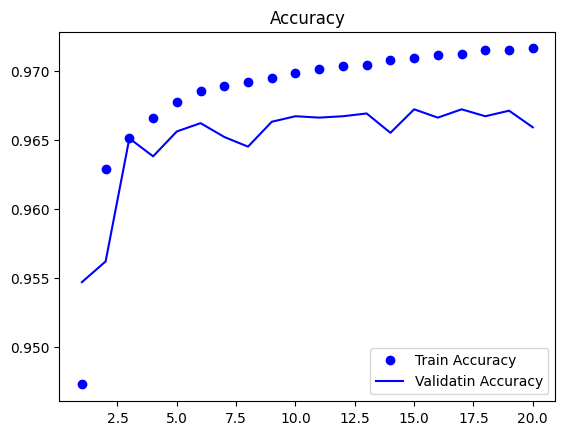

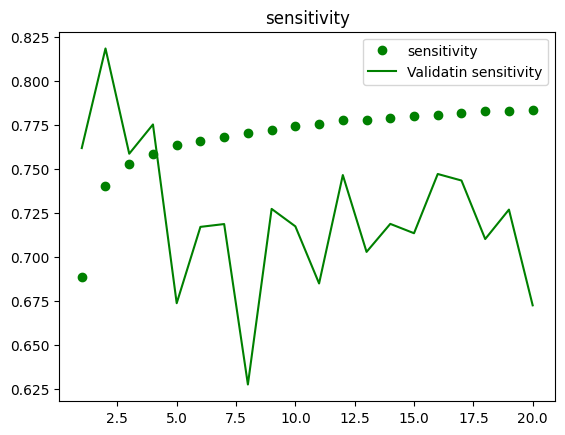

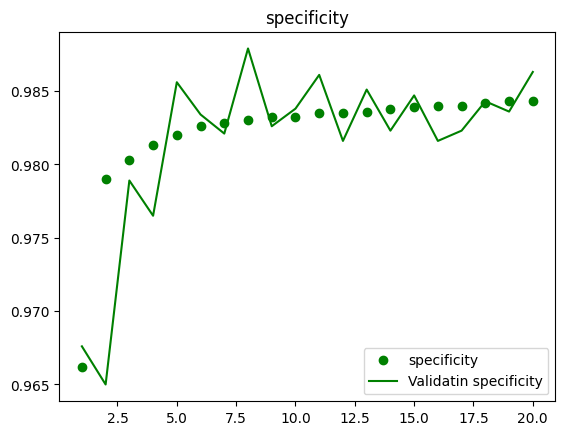

<Figure size 640x480 with 0 Axes>

In [4]:
MODEL_PATH = "/visuworks/Blindless_AIFFELTON/Models/FR_Unet/model_parameters/fr_unet_20ep_512_1024_sG.tf/20--0.1871-0.7834-0.9843-0.6726-0.9863.pb"
model = tf.keras.models.load_model(MODEL_PATH, custom_objects=custom_objects)
# Plot history and pring evaluation of test dataset
metrics.print_evaluation(model, test_generator)
check_result.plot_history(HISTORY_PATH)

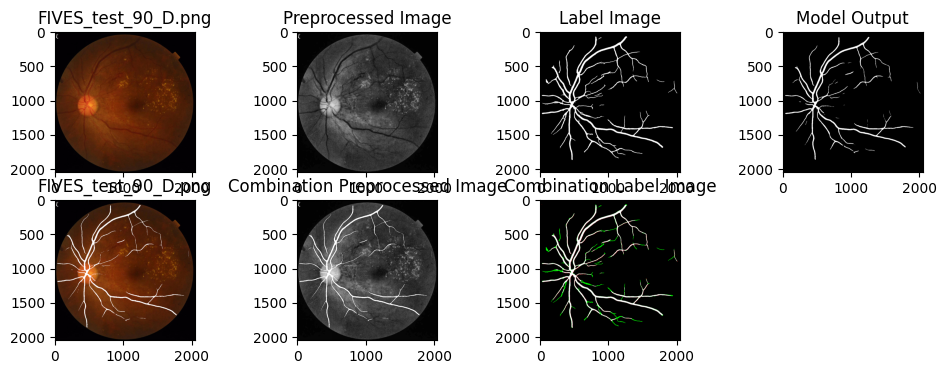

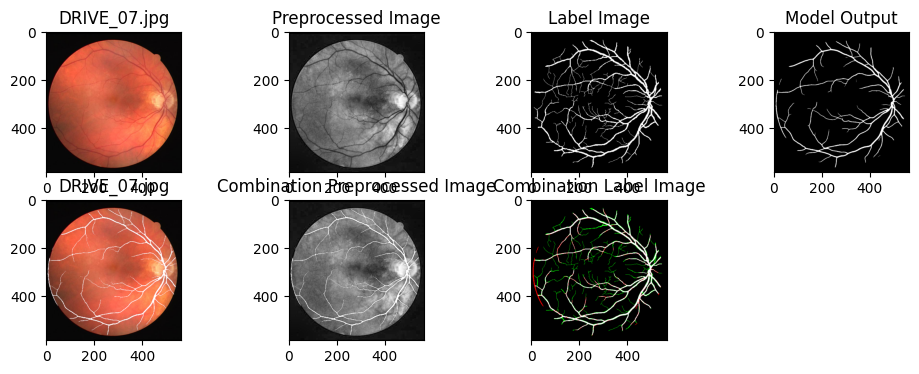

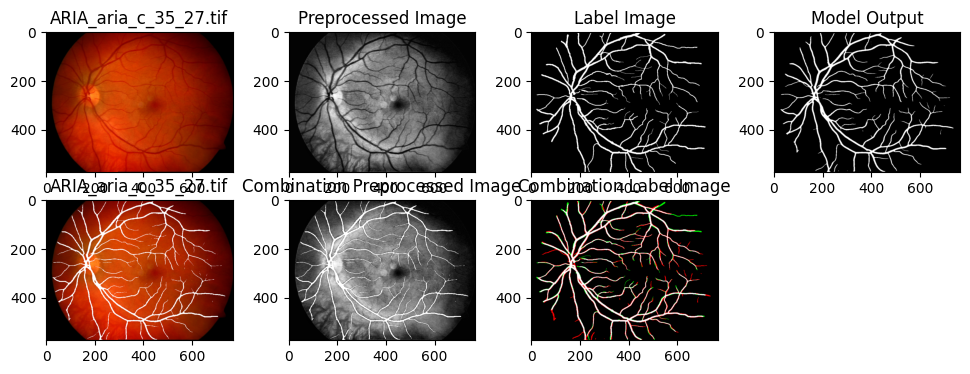

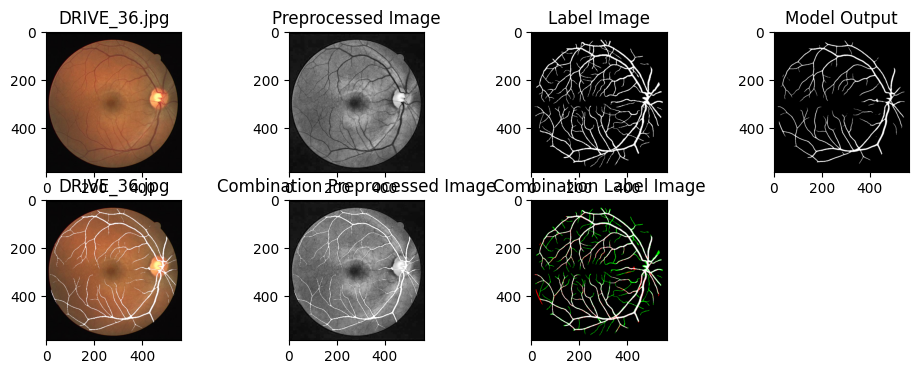

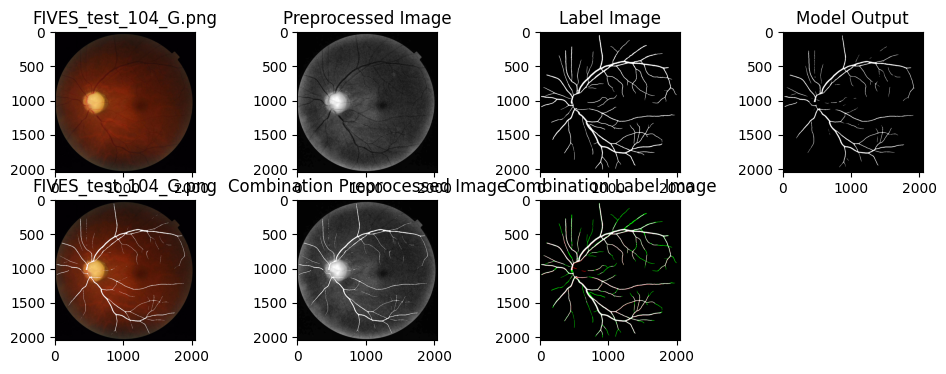

...

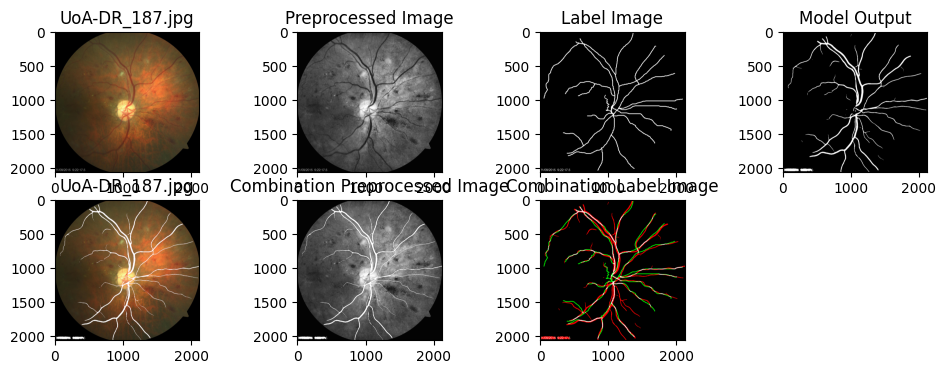

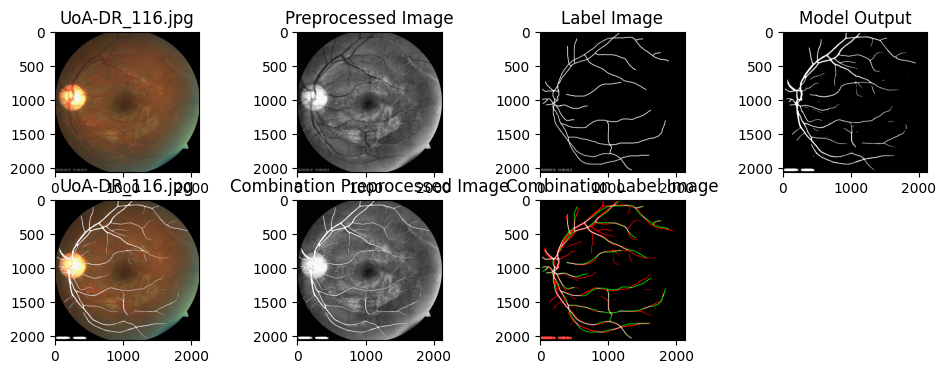

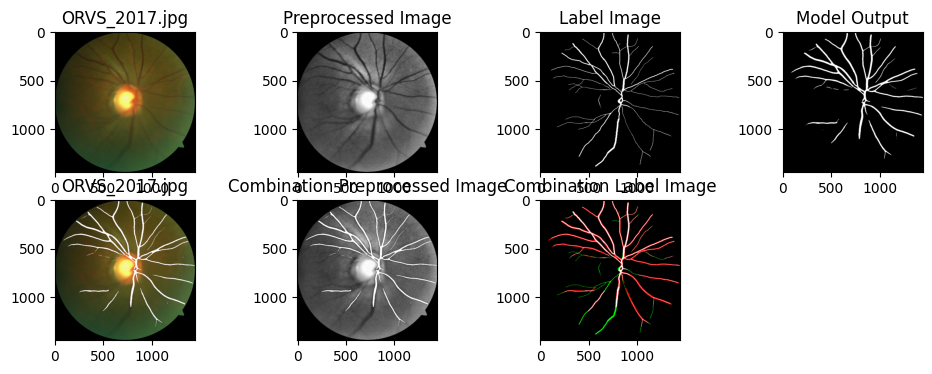

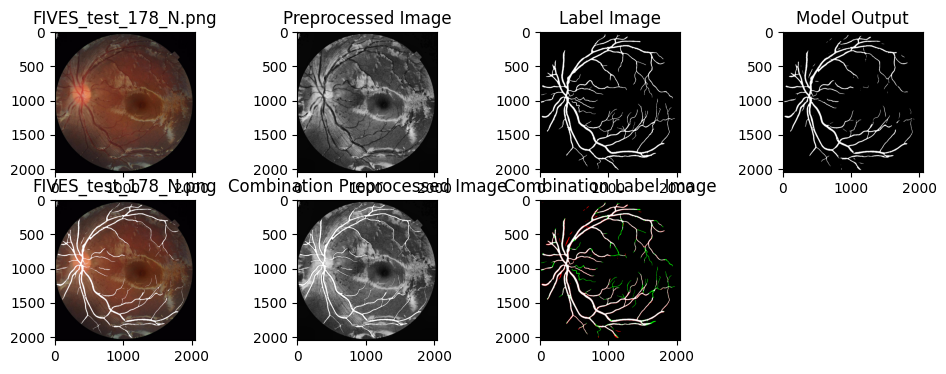

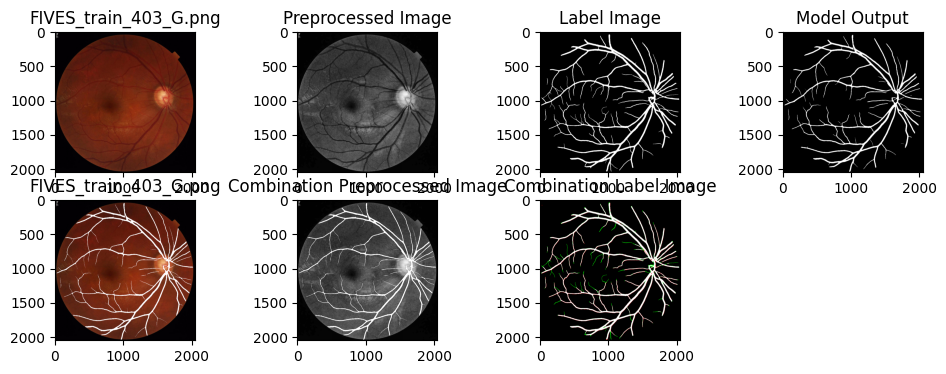

In [5]:
# Load the model with custom_objects parameter
model = tf.keras.models.load_model(MODEL_PATH, custom_objects=custom_objects)

# Plot model result
num_images_to_select = 50
check_result.visualize_SG_result(model, num_images_to_select, SOURCE, INPUT_SHAPE, RESIZE_SHAPE, test_preproc)